In [2]:
#Cargamos librerias
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.special as special
from scipy.optimize import curve_fit
import seaborn as sns
from sklearn.metrics import r2_score

In [3]:
#Carga desde un archivo .xlsx sin indice
Credicel = pd.read_excel('BaseLimpia.xlsx')
Credicel

,folio,folio_solicitud,precio,enganche,descuento,monto_accesorios,status,fraude,inversion,pagos_realizados,...,fecha_ultimo_pago,fecha_pago_proximo,status_cuenta,razones_buro,cp_cliente,cd_cliente,edo_cliente,cd_venta,edo_venta,curp
0,3,30,1949.0,780.0,0.0,0.0,2,0,0,0,...,Desconocido,Desconocido,Aun no se determina status,Desconocido,Desconocido,0,0,Tantoyuca,Veracruz,AEVM980413MVZNDR02
1,4,33,2999.0,1050.0,0.0,0.0,2,0,0,0,...,Desconocido,Desconocido,Aun no se determina status,Desconocido,Desconocido,PUEBLA,PUE.,Heroica Puebla de Zaragoza,Puebla,ZALC610119MPLPRR07
2,5,37,1959.0,490.0,0.0,0.0,3,0,0,0,...,Desconocido,Desconocido,Cancelado,Desconocido,Desconocido,TANTOYUCA,VER.,0,0,0
3,6,38,1959.0,490.0,0.0,0.0,2,0,0,0,...,Desconocido,Desconocido,Aun no se determina status,Desconocido,Desconocido,AMXTLAN PUE,Desconocido,Zacatlan,Puebla,SAMJ790115MPLNRS02
4,7,44,4299.0,1075.0,0.0,0.0,1,0,0,0,...,2022-03-05 00:00:00,2022-03-12 00:00:00,Mora,Desconocido,Desconocido,TANTOYUCA,VER.,Tantoyuca,Veracruz,TEHF880707HVZRRR07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22730,22967,96502,3349.0,297.0,0.0,0.0,1,0,0,0,...,2023-04-18 18:45:00,2023-04-25 00:00:00,Aun no se determina status,"K0,J0,D8,E2",97880,OXKUTZCAB,YUC,Oxkutzcab,Yucatan,PACT990804MYNCCH05
22731,22968,96479,4100.0,1209.0,0.0,0.0,1,0,0,0,...,2023-04-18 18:46:00,2023-04-25 00:00:00,Aun no se determina status,"K0,J0,D8,E2",37295,LEON,GTO,Leon,Guanajuato,HEGB950620MGTRMN03
22732,22969,96442,4849.0,1152.0,0.0,0.0,1,0,0,0,...,2023-04-18 18:47:00,2023-04-25 00:00:00,Aun no se determina status,"K0,D7,F7,D8",20210,AGUASCALIENTES,AGS,Aguascalientes,Aguascalientes,GADF870205HASLZL07
22733,22970,96536,9799.0,2799.0,0.0,0.0,1,0,0,0,...,2023-04-18 18:49:00,2023-04-25 00:00:00,Aun no se determina status,"J0,G1,E0,E2",78434,SOLEDAD DE GRACIANO SANCHEZ,SLP,Soledad De Graciano Sanchez,San Luis Potosi,DELJ700417HSPLRS03


In [4]:
# Separamos los datos cuantitativos también
CredicelNum = Credicel.select_dtypes(np.number)
CredicelNum

,folio,folio_solicitud,precio,enganche,descuento,monto_accesorios,status,fraude,inversion,pagos_realizados,...,puntos,riesgo,score_buro,porc_eng,limite_credito,semana_actual,edad_cliente,costo_total,monto_financiado,semana
0,3,30,1949.0,780.0,0.0,0.0,2,0,0,0,...,0,0.00,0,40.02,5000,26,23,2106,1169.0,81
1,4,33,2999.0,1050.0,0.0,0.0,2,0,0,0,...,0,0.00,0,35.01,6000,13,60,2925,1949.0,225
2,5,37,1959.0,490.0,0.0,0.0,3,0,0,0,...,0,0.00,0,25.01,0,74,58,2210,1469.0,170
3,6,38,1959.0,490.0,0.0,0.0,2,0,0,0,...,0,0.00,0,25.01,7000,13,42,2210,1469.0,170
4,7,44,4299.0,1075.0,0.0,0.0,1,0,0,0,...,0,0.00,0,25.01,7000,74,33,6942,3224.0,178
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22730,22967,96502,3349.0,297.0,0.0,0.0,1,0,0,0,...,10,27.40,469,8.87,10000,0,22,5486,3052.0,211
22731,22968,96479,4100.0,1209.0,0.0,0.0,1,0,0,0,...,9,19.00,502,29.49,5000,0,27,5200,2891.0,200
22732,22969,96442,4849.0,1152.0,0.0,0.0,1,0,0,0,...,11,26.65,459,23.76,4750,0,36,6656,3697.0,256
22733,22970,96536,9799.0,2799.0,0.0,0.0,1,0,0,0,...,14,-17.35,699,28.56,7000,0,53,15054,7000.0,386


c:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


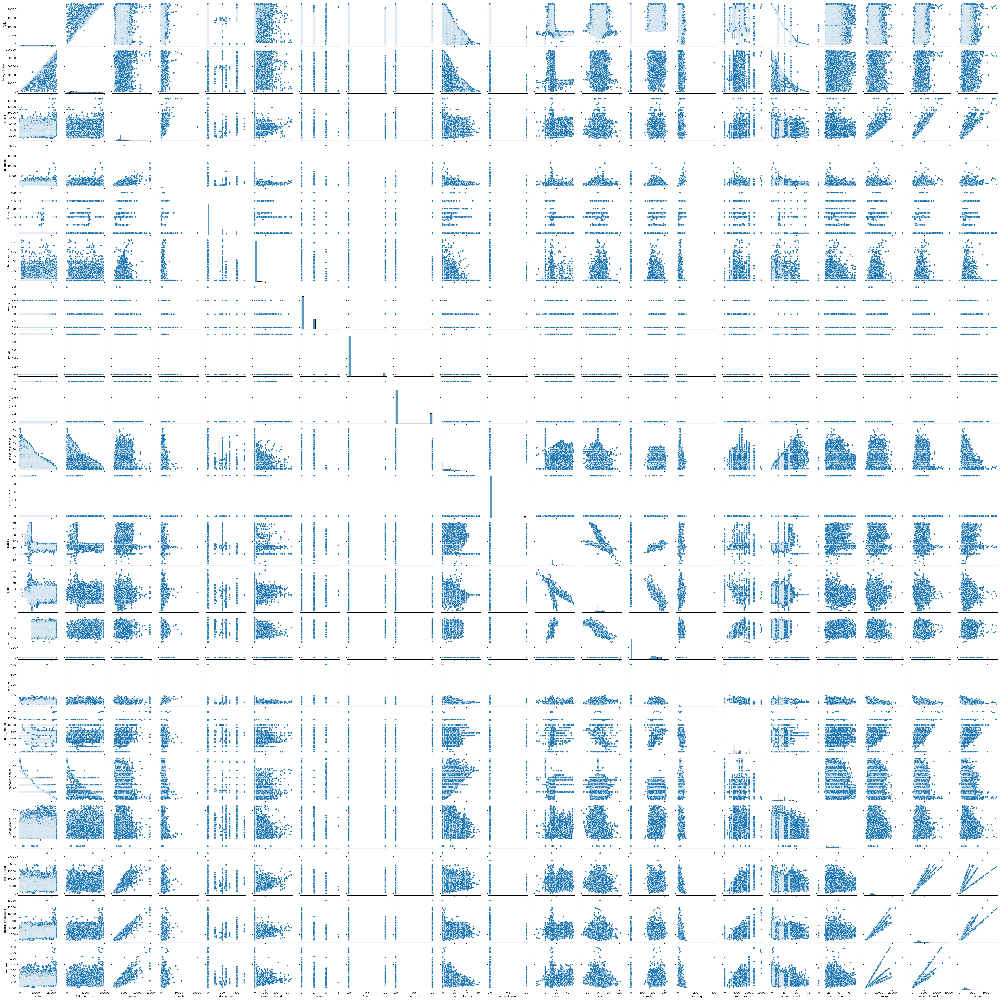

In [5]:
# Gráficamos todas las dispersiones entre todas las variables

sns.pairplot(CredicelNum)

***Modelos de Regresión No Lineales para Límite de Crédito***

**Modelo 1 (Con Score Buro)**

In [6]:
# Límite de Crédito y Score Buro
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep= CredicelNum[['score_buro']]
Var_Dep= CredicelNum['limite_credito']

In [7]:
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

   ** Usamos las siguientes ecuaciones como funciones de ajuste.**

            y = ax^2 + bx + c   ("Función cuadrática")

            y = a*exp(bx) + c   ("Función exponencial")

            y = 1/a*x           ("Función inversa")

            y = a*np.sin(x) + b ("Función senoidal")

            y = a*np.tan(x) + b ("Función tangencial")

            y = a*np.abs(x) + b*x + c (Función Valor absoluto)

            y = (a*x**2 + b)/ c*x (Función cociente entre polinomios)

            y = a*np.log(x) + b  (Función logaritmica)

            y = a*x + b*x + c*x (Función lineal con producto de coeficientes)

            y = 1/a*x**2  (Función cuadrática inversa)

            y = a/b*x**2 + c*x (Función polinomial inversa)


In [8]:
# Hacemos la función del modelo
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [9]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, CredicelNum['score_buro'], CredicelNum['limite_credito'])

In [10]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 2.60332851e-02, -1.66265524e+01,  6.45204025e+03])

In [11]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, CredicelNum['score_buro'], CredicelNum['limite_credito'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a * x ** 2 + b * x + c

In [12]:
#Calculamos las predicciones y reestructuramos el vector de predicciones
#x= x.reshape(51, 1)
#y = y.reshape(51, 1)
#yfit1 = yfit1.reshape(51, 1)
yfit1

,score_buro
0,6452.040251
1,6452.040251
2,6452.040251
3,6452.040251
4,6452.040251
...,...
22730,4380.494616
22731,4666.002943
22732,4305.171253
22733,7549.969285


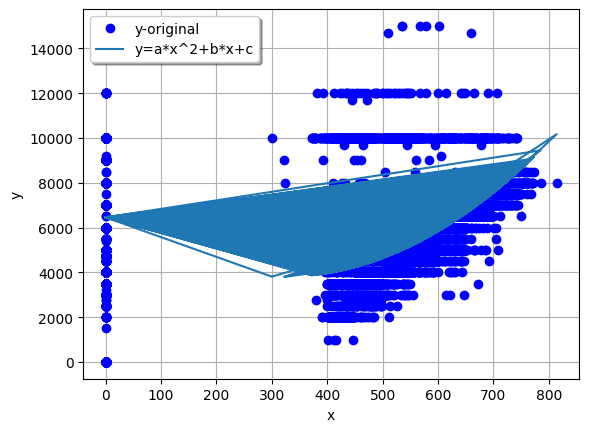

In [13]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a*x^2+b*x+c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [14]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

0.19840911916601012

**Modelo 2 (Con Monto Financiado)**

In [15]:
# Límite de Crédito y Monto Financiado
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep = CredicelNum[['monto_financiado']]
Var_Dep = CredicelNum['limite_credito']

In [16]:
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

In [17]:
# Hacemos la función del modelo
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [18]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, CredicelNum['monto_financiado'], CredicelNum['limite_credito'])

In [19]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 8.6626777e-05, -1.3695317e-01,  5.4173533e+03])

In [20]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, CredicelNum['monto_financiado'], CredicelNum['limite_credito'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a * x ** 2 + b * x + c

In [21]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,monto_financiado
0,5375.635816
1,5479.492130
2,5403.106296
3,5403.106296
4,5876.230244
...,...
22730,5806.275009
22731,5745.437976
22732,6095.035670
22733,8703.393183


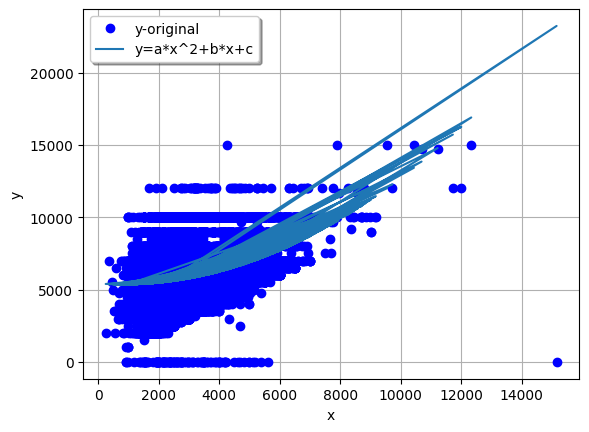

In [22]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a*x^2+b*x+c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [23]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

0.07347429612376988

**Se realizó un modelo eliminando 0 y reemplazando por mediana**

In [24]:
CredicelNum2 = CredicelNum.drop(['folio', 'folio_solicitud'], axis=1)

In [25]:
median_values = CredicelNum2.median()
median_values

precio              3549.00
enganche             826.00
descuento              0.00
monto_accesorios       0.00
status                 1.00
fraude                 0.00
inversion              0.00
pagos_realizados       8.00
reautorizacion         0.00
puntos                12.00
riesgo                 2.25
score_buro           427.00
porc_eng              22.91
limite_credito      6000.00
semana_actual         16.00
edad_cliente          34.00
costo_total         5213.00
monto_financiado    2824.00
semana               214.00
dtype: float64

In [26]:
# Reemplazar los ceros por la mediana de cada columna
df_sin_ceros = CredicelNum2.replace(0, median_values)

c:\Users\angel\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


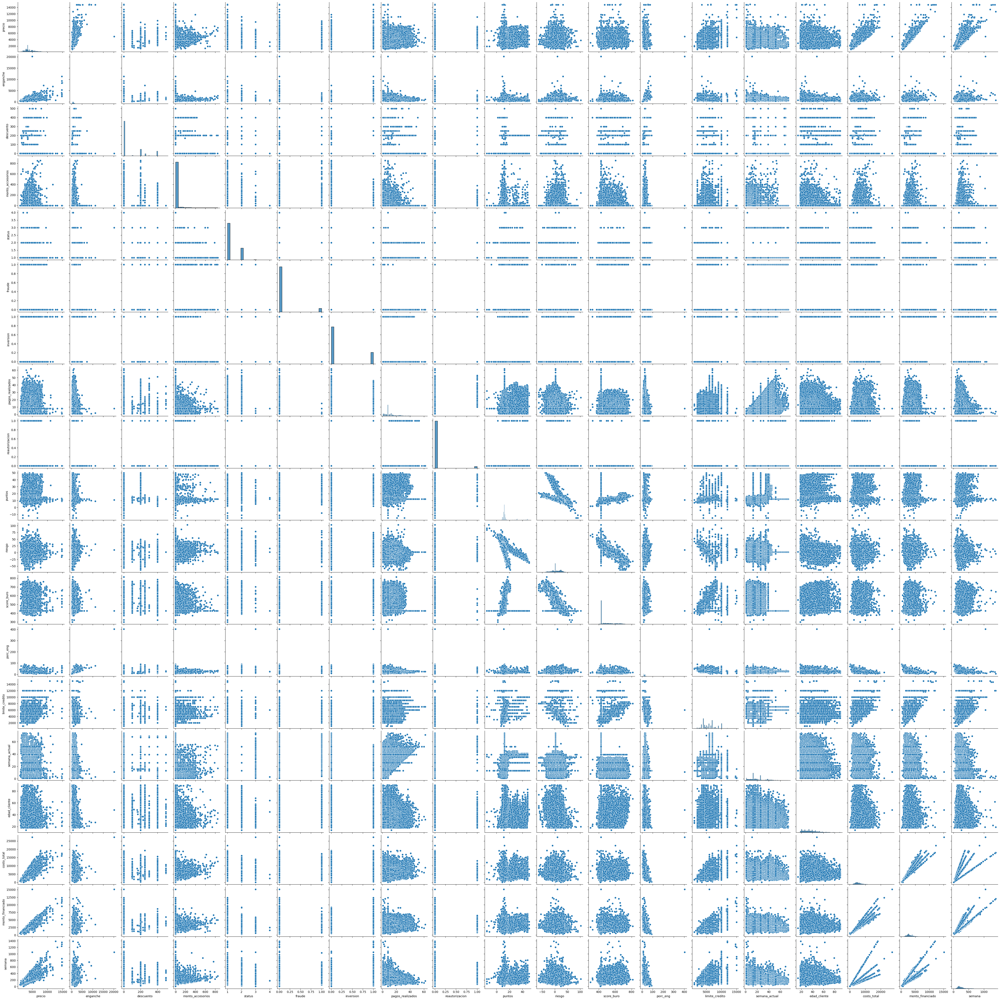

In [27]:
# Gráficamos todas las dispersiones entre todas las variables

sns.pairplot(df_sin_ceros)

In [28]:
# Límite de Crédito y Score Buro
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep = df_sin_ceros[['score_buro']]
Var_Dep = df_sin_ceros['limite_credito']

In [29]:
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

In [30]:
# Hacemos la función del modelo
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [31]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, df_sin_ceros['score_buro'], df_sin_ceros['limite_credito'])

In [32]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 1.02947883e-01, -1.09747302e+02,  3.42289619e+04])

In [33]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, df_sin_ceros['score_buro'], df_sin_ceros['limite_credito'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a * x ** 2 + b * x + c

In [34]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,score_buro
0,6137.248319
1,6137.248319
2,6137.248319
3,6137.248319
4,6137.248319
...,...
22730,5401.996341
22731,5079.094369
22732,5544.113013
22733,7816.036013


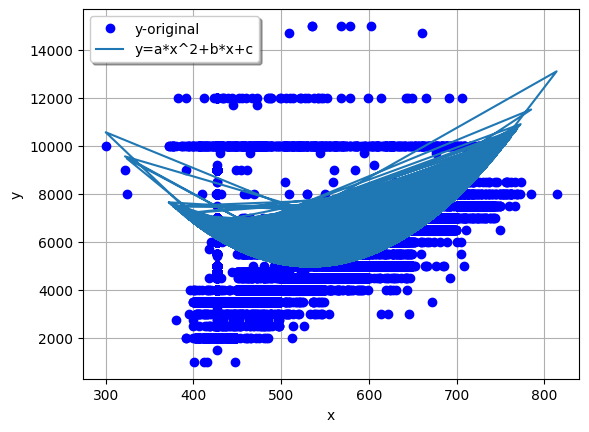

In [35]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a*x^2+b*x+c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [36]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

0.11270137586357887

**Modelo 3 (Con Puntos)**

In [37]:
# Límite de Crédito y Puntos
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep = CredicelNum[['puntos']]
Var_Dep = CredicelNum['limite_credito']

In [38]:
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

In [39]:
# Hacemos la función del modelo
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [40]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, CredicelNum['puntos'], CredicelNum['limite_credito'])

In [41]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 4.24324531e+00, -9.54801515e+01,  5.86972945e+03])

In [42]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, CredicelNum['puntos'], CredicelNum['limite_credito'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a * x ** 2 + b * x + c

In [43]:
#Calculamos las predicciones y reestructuramos el vector de predicciones

yfit1

,puntos
0,5869.729450
1,5869.729450
2,5869.729450
3,5869.729450
4,5869.729450
...,...
22730,5339.252466
22731,5354.110957
22732,5332.880466
22733,5364.683410


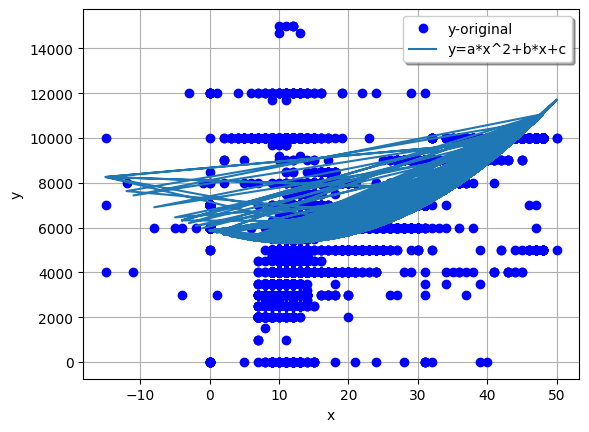

In [44]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a*x^2+b*x+c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [45]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

0.38522108098388175

**Modelo 4 (Con Semana Actual)**

In [46]:
# Límite de Crédito y Semana Actual
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep = CredicelNum[['porc_eng']]
Var_Dep = CredicelNum['limite_credito']

In [47]:
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

In [48]:
# Hacemos la función del modelo
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [49]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, CredicelNum['porc_eng'], CredicelNum['limite_credito'])

In [50]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 5.75620803e-01, -2.21454238e+02,  1.07166918e+04])

In [51]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, CredicelNum['porc_eng'], CredicelNum['limite_credito'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a * x ** 2 + b * x + c

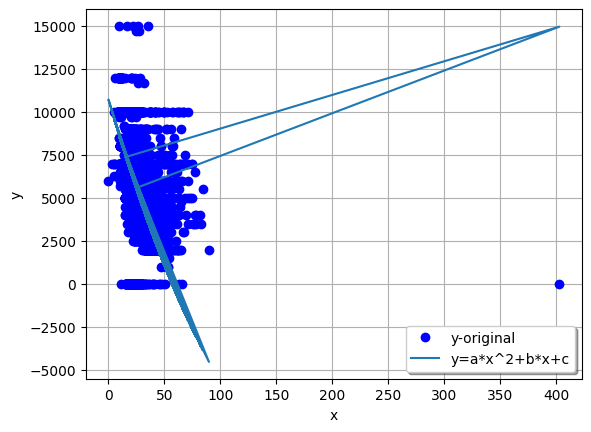

In [52]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a*x^2+b*x+c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [53]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

0.3897732049717715

**Modelo 5 (Riesgo)**

In [54]:
# Límite de Crédito y riesgo
#Declaramos las variables dependientes e independientes para la regresión No lineal
Vars_Indep = CredicelNum[['riesgo']]
Var_Dep = CredicelNum['limite_credito']

In [55]:
#Redefinimos las variables 
x= Vars_Indep
y= Var_Dep

In [56]:
# Hacemos la función del modelo
def  func1 (x, a, b, c):
     return a*x**2 + b*x + c

In [57]:
#Ajustamos los parámetros de la función curve_fit
parametros, covs= curve_fit(func1, CredicelNum['riesgo'], CredicelNum['limite_credito'])

In [58]:
#Obtenemos los coeficientes del modelo de regresión no lineal
parametros

array([ 4.15744704e-01, -9.06806844e+01,  6.25509821e+03])

In [59]:
#Creamos el modelo de predicción con los parámetros obtenidos 
parametros, _ = curve_fit(func1, CredicelNum['riesgo'], CredicelNum['limite_credito'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = a * x ** 2 + b * x + c

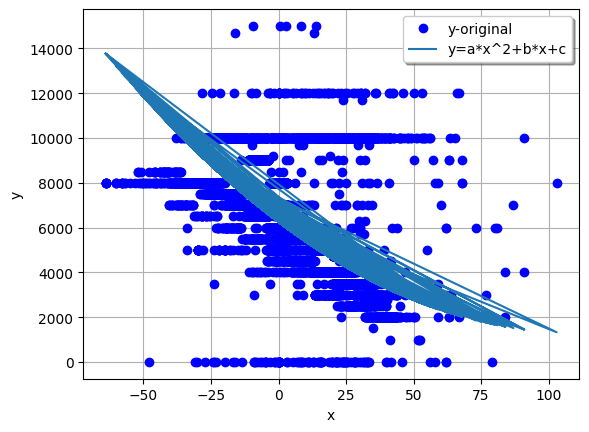

In [60]:
#Graficamos las predicciones y los datos originales para realizar la comparación
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="y=a*x^2+b*x+c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [61]:
#Calculamos el coeficiente de determinación del modelo

R2 = r2_score(y, yfit1) 
R2

0.5337900635813615